<a href="https://colab.research.google.com/github/omkargolatkar/actin_analysis/blob/main/interactive_heatmap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## install modules

In [ ]:
#@title change working directory
%cd /content/drive/MyDrive/Omkar_Masters_thesis/Actin_analysis

/content/drive/MyDrive/Omkar_Masters_thesis/Actin_analysis


In [ ]:
%%capture
!pip install clustergrammer2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.0 MB/s eta 0:00:00


In [ ]:
# enable custom widgets
# https://github.com/googlecolab/colabtools/issues/498
from google.colab import output
output.enable_custom_widget_manager()

# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
%%capture
from clustergrammer2 import net, CGM2, Network
import numpy as np
import pandas as pd
import pickle
import os

from IPython.display import Javascript
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(1, true, {maxHeight: 50000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)


## Interface_matrix_with_annotations

In [ ]:
savepath = "./actin_dataset/actin_database_sheets"
with open(os.path.join(savepath,"actin_interface_matrix.pkl"), 'rb') as g:
    actin_interactor_interface_dict = pickle.load(g)

with open(os.path.join(savepath,"actin_interactor_domains.pkl"), 'rb') as g:
    actin_interactor_domains = pickle.load(g)

<IPython.core.display.Javascript object>

In [ ]:
mod_actin_interactor_interface_dict = {}
for key1, value1 in actin_interactor_interface_dict.items():
  if key1 not in list(actin_interactor_domains.keys()):
    print(key1)
  else:
    mod_actin_interactor_interface_dict[key1] = value1

<IPython.core.display.Javascript object>

('8A5A_1', ('V_act', 'P60010'), ('X', 'Q08561'))
('8BR0_1', ('A_act', 'P68135'), ('B', 'P07737'))
('8BR0_2', ('C_act', 'P68135'), ('D', 'P07737'))
('8IAH_1', ('J_act', 'Q6QAQ1'), ('3', 'I3L5B0'))
('8IAH_1', ('L_act', 'Q6QAQ1'), ('0', 'A0A8D1Q0D0'))
('8IAH_1', ('K_act', 'Q6QAQ1'), ('3', 'I3L5B0'))
('8IAH_1', ('L_act', 'Q6QAQ1'), ('1', 'A0A8D1Q0D0'))
('8IAI_1', ('K_act', 'Q6QAQ1'), ('9', 'A0A8D1Q0D0'))
('8IAI_1', ('K_act', 'Q6QAQ1'), ('3', 'I3L5B0'))
('3MMV_1', ('A_act', 'P10987'), ('X', 'Q9U1K1'))
('8A5O_1', ('V_act', 'P60010'), ('X', 'Q08561'))
('3MN9_1', ('A_act', 'P10987'), ('X', 'Q9U1K1'))
('8C4E_1', ('C_act', 'P68139'), ('K', 'Q8VQB5'))
('3MN6_1', ('A_act', 'P10987'), ('X', 'Q9U1K1'))
('3MN6_2', ('F_act', 'P10987'), ('Y', 'Q9U1K1'))
('3MN6_3', ('K_act', 'P10987'), ('Z', 'Q9U1K1'))
('7ZVW_1', ('B_act', 'Q9P4D1'), ('H', 'C4R7G0'))
('7AD9_1', ('B_act', 'P68135'), ('A', 'Q08641'))
('8UEE_1', ('F_act', 'P68135'), ('C', 'P0CL52'))
('4M63_1', ('C_act', 'P10987'), ('A', 'L0I5A1'))
('4M63_1

In [ ]:
heatmap_dict = {}
mod_interface_dict = {}
for key, value in mod_actin_interactor_interface_dict.items():
  if 'act' in key[2][0]:
    mod_interface_dict[key] = value
  #else:
  # mod_interface_dict[key] = value

for key, value in mod_interface_dict.items():
  for residx in range(1, len(value)+1):
    heatmap_dict[(key, residx)] = value[residx - 1]

ser = pd.Series(list(heatmap_dict.values()),index=pd.MultiIndex.from_tuples(heatmap_dict.keys()))
interface_df = ser.unstack().fillna(0)

savepath = "./actin_dataset/actin_database_sheets" #param {type: "string"}
interface_df.to_csv(os.path.join(savepath,"actin_interface_matrix_temp.csv"))

dom_lst_len = 0
for key, value in actin_interactor_domains.items():
  dom_lst = value
  if len(dom_lst) > dom_lst_len:
    dom_lst_len = len(dom_lst)


<IPython.core.display.Javascript object>

In [ ]:
for key, value in actin_interactor_domains.items():
  dom_lst = value
  while len(dom_lst) < 4:
    dom_lst.append('undefined')
  actin_interactor_domains[key] = dom_lst

dom_dict = {}
for key, value in actin_interactor_domains.items():
  for domidx in range(1, len(value)+1):
    dom_dict[(key, domidx)] = value[domidx-1]

ser = pd.Series(list(dom_dict.values()),index=pd.MultiIndex.from_tuples(dom_dict.keys()))
dom_df = ser.unstack().fillna(0)

savepath = "./actin_dataset/actin_database_sheets" #param {type: "string"}
dom_df.to_csv(os.path.join(savepath,"actin_interactor_domain_annot_temp.csv"))

<IPython.core.display.Javascript object>

In [ ]:
interface_mtrx = "./actin_dataset/actin_database_sheets/actin_interface_matrix_temp.csv"
#markdown - **mtrx** `-` row names of interface matrix
mtrx = pd.read_csv(interface_mtrx, index_col = 0)
#mtrx = mtrx.iloc[0:100]

for id, row in mtrx.iterrows():
  row_lst = list(row)
  for elem in row_lst:
    if elem != 0.0 and elem!= 1.0:
      print(elem)

mtrx = mtrx.replace(0.0, 0.001)

<IPython.core.display.Javascript object>

In [ ]:
#df_dom = pd.DataFrame('Undefined', index=mtrx.index.tolist(), columns=['Domain'])
domain_annot_mtrx = "./actin_dataset/actin_database_sheets/actin_interactor_domain_annot_temp.csv"
df_dom = pd.read_csv(domain_annot_mtrx, index_col = 0)
#for id, row in df_dom.iterrows():
  #int_unp = id[2][1]
#  df_dom.loc[id, 'Domain'] = actin_interactor_domains[id]

<IPython.core.display.Javascript object>

In [ ]:
domain_diction = {}
for index, row in df_dom.iterrows():
  domain_lst = [dom for dom in list(row) if dom not in ["undefined"]]
  domain_diction[index] = domain_lst

for k, v in domain_diction.items():
  if v == []:
    print(k, v)
  elif len(list(filter(lambda x: x != 'non_rep_domain', v))) > 1:
    # print(k,v)
    domain_diction[k] = [list(filter(lambda x: x != 'non_rep_domain', v))[0]]
  elif len(list(filter(lambda x: x != 'non_rep_domain', v))) == 1:
    # print(k,v)
    domain_diction[k] = list(filter(lambda x: x != 'non_rep_domain', v))

for k, v in domain_diction.items():
  if len(v) != 1:
    print(k,v)
df_dom1 = df_dom.from_dict(domain_diction, orient='index', dtype=None)
df_dom1.columns = ['1']

<IPython.core.display.Javascript object>

## viz

In [ ]:
# setting some preferred categories is required, but you can write out other
# custom categories as well in the dendrogram menu
net.reset()
meta_cat = pd.DataFrame()
meta_cat.loc['dog', 'color'] = 'red'
#for i in range(1, 350):
#  meta_cat.loc[i, 'color'] = 'red'
meta_cat.loc['cat', 'color'] = 'blue'
net.load_df(mtrx, meta_row = df_dom1)

# net.set_cat_color(0,2, '2: non_rep_domain', '#ffffff')
# net.set_cat_color(0,3, '3: non_rep_domain', '#ffffff')
# net.set_cat_color(0,2, '2: undefined', '#ffffff')
# net.set_cat_color(0,3, '3: undefined', '#ffffff')
# net.set_cat_color(0,4, '4: undefined', '#ffffff')
mtrx_df = net.export_df()
net.load_df(mtrx_df)

#net.normalize(norm_type='zscore', axis='row')
#net.downsample(ds_type='kmeans', axis='row', num_samples=5, random_state=1000)
#net.set_manual_category(col='Label', preferred_cats=meta_cat)
net.cluster(dist_type='euclidean', linkage_type='ward', dendro=True, views=['N_row_clust', 'N_row_ini'], sim_mat='row')
net.widget()


<IPython.core.display.Javascript object>

CGM2(network='{"row_nodes": [{"name": "(\'1LCU_1\', (\'A_act\', \'P68135\'), (\'B_act\', \'P68135\'))", "ini":…

In [ ]:
from clustergrammer2 import make_clust_fun
# make_clust_fun.make_clust(net, dist_type='euclidean',sim_mat=True)
make_clust_fun.make_clust(net, dist_type='euclidean', sim_mat='row')
# net.viz['views']
net.widget('sim_row')

<IPython.core.display.Javascript object>

CGM2(network='{"row_nodes": [{"name": "(\'1LCU_1\', (\'A_act\', \'P68135\'), (\'B_act\', \'P68135\'))", "ini":…

## Interface_matrix_with_annotations_actin_protein

In [ ]:
savepath = "/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets"
with open(os.path.join(savepath,"actin_interface_matrix.pkl"), 'rb') as g:
    actin_interactor_interface_dict = pickle.load(g)

with open(os.path.join(savepath,"actin_interactor_domains.pkl"), 'rb') as g:
    actin_interactor_domains = pickle.load(g)

<IPython.core.display.Javascript object>

In [ ]:
mod_actin_interactor_interface_dict = {}
for key1, value1 in actin_interactor_interface_dict.items():
  if key1 not in list(actin_interactor_domains.keys()):
    print(key1)
  else:
    mod_actin_interactor_interface_dict[key1] = value1

<IPython.core.display.Javascript object>

('8BR1_1', ('A_act', 'P68135'), ('B', 'A0A6N3LUE9'))
('8BR1_2', ('C_act', 'P68135'), ('D', 'A0A6N3LUE9'))
('4M63_1', ('C_act', 'P10987'), ('A', 'L0I5A1'))
('4M63_1', ('E_act', 'P10987'), ('B', 'L0I5A1'))
('4M63_1', ('C_act', 'P10987'), ('B', 'L0I5A1'))
('8A5A_1', ('V_act', 'P60010'), ('X', 'Q08561'))
('8BJJ_1', ('A_act', 'P68135'), ('B', 'A0A6N3LUE9'))
('8BO1_1', ('A_act', 'P68135'), ('B', 'A0A6N3LUE9'))
('8BO1_2', ('C_act', 'P68135'), ('D', 'A0A6N3LUE9'))
('8A5O_1', ('V_act', 'P60010'), ('X', 'Q08561'))
('8C4E_1', ('B_act', 'P68139'), ('D_act', 'P68139'))
('8C4E_1', ('H_act', 'P68139'), ('F_act', 'P68139'))
('8C4E_1', ('F_act', 'P68139'), ('K', 'Q8VQB5'))
('8C4E_1', ('C_act', 'P68139'), ('N', 'Q8VQB5'))
('8C4E_1', ('B_act', 'P68139'), ('A_act', 'P68139'))
('8C4E_1', ('D_act', 'P68139'), ('E_act', 'P68139'))
('8C4E_1', ('D_act', 'P68139'), ('C_act', 'P68139'))
('8C4E_1', ('E_act', 'P68139'), ('D_act', 'P68139'))
('8C4E_1', ('G_act', 'P68139'), ('H_act', 'P68139'))
('8C4E_1', ('C_act', 

In [ ]:
heatmap_dict = {}
mod_interface_dict = {}
for key, value in mod_actin_interactor_interface_dict.items():
  if 'act'not in key[2][0]:
    mod_interface_dict[key] = value
  #else:
  # mod_interface_dict[key] = value

for key, value in mod_interface_dict.items():
  for residx in range(1, len(value)+1):
    heatmap_dict[(key, residx)] = value[residx - 1]

ser = pd.Series(list(heatmap_dict.values()),index=pd.MultiIndex.from_tuples(heatmap_dict.keys()))
interface_df = ser.unstack().fillna(0)

savepath = "./actin_dataset/actin_database_sheets" #param {type: "string"}
interface_df.to_csv(os.path.join(savepath,"actin_protein_interface_matrix_temp.csv"))

dom_lst_len = 0
for key, value in actin_interactor_domains.items():
  dom_lst = value
  if len(dom_lst) > dom_lst_len:
    dom_lst_len = len(dom_lst)


<IPython.core.display.Javascript object>

In [ ]:
for key, value in actin_interactor_domains.items():
  dom_lst = value
  while len(dom_lst) < 4:
    dom_lst.append('undefined')
  actin_interactor_domains[key] = dom_lst

dom_dict = {}
for key, value in actin_interactor_domains.items():
  for domidx in range(1, len(value)+1):
    dom_dict[(key, domidx)] = value[domidx-1]

ser = pd.Series(list(dom_dict.values()),index=pd.MultiIndex.from_tuples(dom_dict.keys()))
dom_df = ser.unstack().fillna(0)

savepath = "./actin_dataset/actin_database_sheets" #param {type: "string"}
dom_df.to_csv(os.path.join(savepath,"actin_protein_interactor_domain_annot_temp.csv"))

<IPython.core.display.Javascript object>

In [ ]:
interface_mtrx = "./actin_dataset/actin_database_sheets/actin_protein_interface_matrix_temp.csv"
#markdown - **mtrx** `-` row names of interface matrix
mtrx = pd.read_csv(interface_mtrx, index_col = 0)
#mtrx = mtrx.iloc[0:100]

for id, row in mtrx.iterrows():
  row_lst = list(row)
  for elem in row_lst:
    if elem != 0.0 and elem!= 1.0:
      print(elem)

mtrx = mtrx.replace(0.0, 0.001)

<IPython.core.display.Javascript object>

In [ ]:
#df_dom = pd.DataFrame('Undefined', index=mtrx.index.tolist(), columns=['Domain'])
domain_annot_mtrx = "./actin_dataset/actin_database_sheets/actin_interactor_domain_annot_temp.csv"
df_dom = pd.read_csv(domain_annot_mtrx, index_col = 0)
#for id, row in df_dom.iterrows():
  #int_unp = id[2][1]
#  df_dom.loc[id, 'Domain'] = actin_interactor_domains[id]



<IPython.core.display.Javascript object>

In [ ]:
domain_diction = {}
for index, row in df_dom.iterrows():
  domain_lst = [dom for dom in list(row) if dom not in ["undefined"]]
  domain_diction[index] = domain_lst

for k, v in domain_diction.items():
  if v == []:
    print(k, v)
  elif len(list(filter(lambda x: x != 'non_rep_domain', v))) > 1:
    print(k,v)
    domain_diction[k] = [list(filter(lambda x: x != 'non_rep_domain', v))[0]]
  # elif len(list(filter(lambda x: x != 'non_rep_domain', v))) == 1:
    # print(k,v)
    # domain_diction[k] = list(filter(lambda x: x != 'non_rep_domain', v))

# for k, v in domain_diction.items():
#   if len(v) != 1:
#     print(k,v)
# df_dom2 = df_dom.from_dict(domain_diction, orient='index', dtype=None)
# df_dom2.columns = ['1']

<IPython.core.display.Javascript object>

('1ATN_1', ('A_act', 'P68135'), ('D', 'P00639')) ['deoxyribonuclease I', 'Deoxyribonuclease I', 'Endonuclease/exonuclease/phosphatase superfamily']
('1C0F_1', ('A_act', 'P07830'), ('S', 'P06396')) ['Gelsolin sub-domain 1-like domain found in gelsolin, severin, villin, and related proteins', 'Villin/Gelsolin', 'ADF-H/Gelsolin-like domain superfamily']
('1C0G_1', ('A_act', 'P07830'), ('S', 'P06396')) ['Gelsolin sub-domain 1-like domain found in gelsolin, severin, villin, and related proteins', 'Villin/Gelsolin', 'ADF-H/Gelsolin-like domain superfamily']
('1D4X_1', ('A_act', 'P0DM41'), ('G', 'P06396')) ['Gelsolin sub-domain 1-like domain found in gelsolin, severin, villin, and related proteins', 'Villin/Gelsolin', 'ADF-H/Gelsolin-like domain superfamily']
('1DEJ_1', ('A_act', 'P07830'), ('S', 'P06396')) ['Gelsolin sub-domain 1-like domain found in gelsolin, severin, villin, and related proteins', 'Villin/Gelsolin', 'ADF-H/Gelsolin-like domain superfamily']
('1EQY_1', ('A_act', 'P68135'), 

In [ ]:
# setting some preferred categories is required, but you can write out other
# custom categories as well in the dendrogram menu
net.reset()
meta_cat = pd.DataFrame()
meta_cat.loc['dog', 'color'] = 'red'
#for i in range(1, 350):
#  meta_cat.loc[i, 'color'] = 'red'
meta_cat.loc['cat', 'color'] = 'blue'
net.load_df(mtrx, meta_row = df_dom1)

# net.set_cat_color(0,2, '2: non_rep_domain', '#ffffff')
# net.set_cat_color(0,3, '3: non_rep_domain', '#ffffff')
# net.set_cat_color(0,2, '2: undefined', '#ffffff')
# net.set_cat_color(0,3, '3: undefined', '#ffffff')
# net.set_cat_color(0,4, '4: undefined', '#ffffff')
mtrx_df = net.export_df()
net.load_df(mtrx_df)

#net.normalize(norm_type='zscore', axis='row')
#net.downsample(ds_type='kmeans', axis='row', num_samples=5, random_state=1000)
#net.set_manual_category(col='Label', preferred_cats=meta_cat)
net.cluster(dist_type='euclidean', linkage_type='ward', dendro=True, views=['N_row_clust', 'N_row_ini'], sim_mat='row')
net.widget()


<IPython.core.display.Javascript object>

KeyError: '["(\'3MMV_1\', (\'A_act\', \'P10987\'), (\'X\', \'Q9U1K1\'))", "(\'3MN6_1\', (\'A_act\', \'P10987\'), (\'X\', \'Q9U1K1\'))", "(\'3MN6_2\', (\'F_act\', \'P10987\'), (\'Y\', \'Q9U1K1\'))", "(\'3MN6_3\', (\'K_act\', \'P10987\'), (\'Z\', \'Q9U1K1\'))", "(\'3MN9_1\', (\'A_act\', \'P10987\'), (\'X\', \'Q9U1K1\'))", "(\'7AD9_1\', (\'B_act\', \'P68135\'), (\'A\', \'Q08641\'))", "(\'7ZVW_1\', (\'B_act\', \'Q9P4D1\'), (\'H\', \'C4R7G0\'))", "(\'8BR0_1\', (\'A_act\', \'P68135\'), (\'B\', \'P07737\'))", "(\'8BR0_2\', (\'C_act\', \'P68135\'), (\'D\', \'P07737\'))", "(\'8IAH_1\', (\'J_act\', \'Q6QAQ1\'), (\'3\', \'I3L5B0\'))", "(\'8IAH_1\', (\'K_act\', \'Q6QAQ1\'), (\'3\', \'I3L5B0\'))", "(\'8IAH_1\', (\'L_act\', \'Q6QAQ1\'), (\'0\', \'A0A8D1Q0D0\'))", "(\'8IAH_1\', (\'L_act\', \'Q6QAQ1\'), (\'1\', \'A0A8D1Q0D0\'))", "(\'8IAI_1\', (\'K_act\', \'Q6QAQ1\'), (\'3\', \'I3L5B0\'))", "(\'8IAI_1\', (\'K_act\', \'Q6QAQ1\'), (\'9\', \'A0A8D1Q0D0\'))", "(\'8UEE_1\', (\'F_act\', \'P68135\'), (\'C\', \'P0CL52\'))"] not in index'

In [ ]:
from clustergrammer2 import make_clust_fun
# make_clust_fun.make_clust(net, dist_type='euclidean',sim_mat=True)
make_clust_fun.make_clust(net, dist_type='euclidean', sim_mat='row')
# net.viz['views']
widet = net.widget('sim_row')

<IPython.core.display.Javascript object>

In [ ]:
from clustergrammer2 import make_clust_fun
# make_clust_fun.make_clust(net, dist_type='euclidean',sim_mat=True)
make_clust_fun.make_clust(net, dist_type='euclidean', sim_mat='col')
# net.viz['views']
widet = net.widget('sim_col')

<IPython.core.display.Javascript object>

In [ ]:
widet

<IPython.core.display.Javascript object>

CGM2(network='{"row_nodes": [{"name": "1", "ini": 379, "clust": 141, "rank": 303, "rankvar": 303}, {"name": "2…

## general

In [ ]:
net.write_json_to_file('viz', '/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets/mult_view.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title generate random matrix
num_cols = 100
num_rows = 100

np.random.seed(seed=100)
mat = np.random.rand(num_rows, num_cols)

# make row and col labels
rows = range(num_rows)
cols = range(num_cols)
rows = [str(i) for i in rows]
cols = [str(i) for i in cols]

# make dataframe
df = pd.DataFrame(data=mat, columns=cols, index=rows)
df.shape

<IPython.core.display.Javascript object>

(100, 100)

In [ ]:
interface_mtrx = "/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets/actin_interface_matrix.csv"
#markdown - **mtrx** `-` row names of interface matrix
mtrx = pd.read_csv(interface_mtrx, index_col = 0)
#mtrx = mtrx.iloc[0:100]

for id, row in mtrx.iterrows():
  row_lst = list(row)
  for elem in row_lst:
    if elem != 0.0 and elem!= 1.0:
      print(elem)

mtrx = mtrx.replace(0.0, 0.01)

# for id, row in mtrx.iterrows():
#   chain2 = id.split("(")
#   if 'act' in chain2[2]:

# list_of_dict = []
# for id, row in mtrx.iterrows():
#   chain2 = id.split(",")
#   if 'act' in chain2[-2]:
#     r = row.to_dict()
#     list_of_dict.append(r)

# mtrx_act =  pd.DataFrame(list_of_dict)

<IPython.core.display.Javascript object>

In [ ]:
import pickle
import os
savepath = "/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets"
with open(os.path.join(savepath,"actin_interface_matrix.pkl"), 'rb') as g:
    actin_interactor_interface_dict = pickle.load(g)

<IPython.core.display.Javascript object>

In [ ]:
heatmap_dict = {}
mod_interface_dict = {}
for key, value in actin_interactor_interface_dict.items():
  if 'act' in key[2][0]:
    mod_interface_dict[key] = value

for key, value in mod_interface_dict.items():
  for residx in range(1, len(value)+1):
    heatmap_dict[(key, residx)] = value[residx - 1]

ser = pd.Series(list(heatmap_dict.values()),index=pd.MultiIndex.from_tuples(heatmap_dict.keys()))
interface_df = ser.unstack().fillna(0)

savepath = "/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets" #param {type: "string"}
interface_df.to_csv(os.path.join(savepath,"actin_interface_matrix_temp.csv"))

<IPython.core.display.Javascript object>

In [ ]:
interface_mtrx = "/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets/actin_interface_matrix_temp.csv"
#markdown - **mtrx** `-` row names of interface matrix
mtrx = pd.read_csv(interface_mtrx, index_col = 0)
#mtrx = mtrx.iloc[0:100]

for id, row in mtrx.iterrows():
  row_lst = list(row)
  for elem in row_lst:
    if elem != 0.0 and elem!= 1.0:
      print(elem)

#mtrx = mtrx.replace(0.0, 0.01)

<IPython.core.display.Javascript object>

In [ ]:
df_meta = pd.DataFrame('Undefined', index=mtrx.columns.tolist(), columns=['Label', 'Label2'])
for id, row in df_meta.iterrows():
  if 1<int(id)<100:
    df_meta.loc[id, 'Label'] = "defined"

#df_meta1 = pd.DataFrame('Undefined', index=mtrx.columns.tolist(), columns=['Label'])
for id, row in df_meta.iterrows():
  if 101<int(id)<200:
    df_meta.loc[id, 'Label2'] = "defined"

df_meta2 = pd.DataFrame('Undefined', index=mtrx.index.tolist(), columns=['Label'])
for id, row in df_meta2.iterrows():
  fkl = id
  if '_1' in id:
    df_meta2.loc[id, 'Label'] = "defined"

<IPython.core.display.Javascript object>

In [ ]:
# setting some preferred categories is required, but you can write out other
# custom categories as well in the dendrogram menu
meta_cat = pd.DataFrame()
meta_cat.loc['dog', 'color'] = 'red'
#for i in range(1, 350):
#  meta_cat.loc[i, 'color'] = 'red'
meta_cat.loc['cat', 'color'] = 'blue'

<IPython.core.display.Javascript object>

In [ ]:
net.load_df(mtrx, meta_col=df_meta, meta_row = df_meta2)
net.normalize(norm_type='zscore', axis='row')
#net.downsample(ds_type='kmeans', axis='row', num_samples=5, random_state=1000)
net.set_manual_category(col='Label', preferred_cats=meta_cat)
net.cluster(dist_type='euclidean', linkage_type='ward', dendro=True, views=['N_row_clust', 'N_row_ini'])
net.widget()


<IPython.core.display.Javascript object>

CGM2(manual_cat='{"col": {"col_cat_colors": {"Label: Undefined": "#ff7f0e", "Label: defined": "#98df8a"}, "Lab…

In [ ]:
net.write_json_to_file('viz', '/content/drive/MyDrive/Omkar_Masters_thesis/actin_dataset/actin_database_sheets/mult_view.json')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
net.dat_to_df()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,1,2,3,4,5,6,7,8,9,10,...,370,371,372,373,374,375,376,377,378,379
cluster-1,-0.291789,-0.291789,-0.291789,-0.291789,-0.291789,-0.291789,-0.291205,-0.291789,-0.291789,-0.291789,...,-0.290282,-0.290282,-0.289464,-0.289464,-0.291789,-0.289464,-0.158664,0.368868,0.843906,2.235552
cluster-2,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,...,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426,-0.219426
cluster-3,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,-0.209589,...,-0.209013,-0.209013,-0.043096,-0.209589,-0.209589,0.377320,-0.132194,-0.209589,-0.209589,0.041569
cluster-4,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,...,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496,-0.286496
cluster-5,-0.172524,-0.172524,-0.172524,-0.172524,-0.172524,-0.172524,0.638605,0.119109,-0.172524,-0.172524,...,0.237001,0.237001,0.615462,0.615462,-0.172524,0.150533,0.887470,0.723216,0.193914,-0.172524


## widget

In [ ]:
!pip install clustergrammer_widget

<IPython.core.display.Javascript object>

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 654.3/654.3 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for clustergrammer_widget: filename=clustergrammer_widget-1.13.3-py2.py3-none-any.whl size=1285884 sha256=f2b5f4f6563dba92b3fc14903ba44e252db3cae31c0ac708c2f49ae8bc02b474
  Stored in directory: /root/.cache/pip/wheels/1f/d5/40/832bf2969078151ca7182096c9671aef5d30e70e1d1c8d1578
Successfully built clustergrammer_widget


In [ ]:
# import the widget
from clustergrammer_widget import *
from copy import deepcopy

# load data into new network instance and cluster
net = deepcopy(Network())
net.load_file('rc_two_cats.txt')
net.make_clust()

# view the results as a widget
clustergrammer_notebook(network = net.export_net_json())

In [ ]:
# upload a file to the clustergrammer web app and visualize using an Iframe
from clustergrammer2 import Network
from copy import deepcopy
net = deepcopy(Network())
link = net.Iframe_web_app('/content/rc_two_cats.txt')
print(link)

<IPython.core.display.Javascript object>

http://maayanlab.cloud/clustergrammer/viz/65c32304a2b01c02bb4c1f4f/rc_two_cats.txt


## rough

In [ ]:
!pip install dash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 46.6 MB/s eta 0:00:00


In [ ]:
!pip install dash-bio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 38.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.5/278.5 kB 27.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.2/20.2 MB 29.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.5/752.5 kB 34.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 5.2 MB/s eta 0:00:00
  Created wheel for dash-bio: filename=dash_bio-1.0.2-py3-none-any.whl size=10338083 sha256=61a307763cf97273b7a4475d3a6aee08e3a4af8ccbdff29d4dbbb1d1d9ef23e6
  Stored in directory: /root/.cache/pip/wheels/cb/97/9c/49463914611cb715a46d21a3896d9a886318ea0c451e840196
  Created wheel for GEOparse: filename=GEOparse-2.0.3-py3-none-any.whl size=29046 sha256=d1ff2b765a8091e4e54a7d7adaad3ca64d04c1c0ef21a41c788b9c94cec17274
  Stored in directory: /root/.cache/pip/wheels/14/96/

In [ ]:
import plotly.graph_objects as go

     sepal_length  sepal_width  petal_length  petal_width    species
0             5.1          3.5           1.4          0.2     setosa
1             4.9          3.0           1.4          0.2     setosa
2             4.7          3.2           1.3          0.2     setosa
3             4.6          3.1           1.5          0.2     setosa
4             5.0          3.6           1.4          0.2     setosa
..            ...          ...           ...          ...        ...
145           6.7          3.0           5.2          2.3  virginica
146           6.3          2.5           5.0          1.9  virginica
147           6.5          3.0           5.2          2.0  virginica
148           6.2          3.4           5.4          2.3  virginica
149           5.9          3.0           5.1          1.8  virginica

[150 rows x 5 columns]
     species species
0    #ED2323       r
1    #ED2323       r
2    #ED2323       r
3    #ED2323       r
4    #ED2323       r
..       ...     ...
1

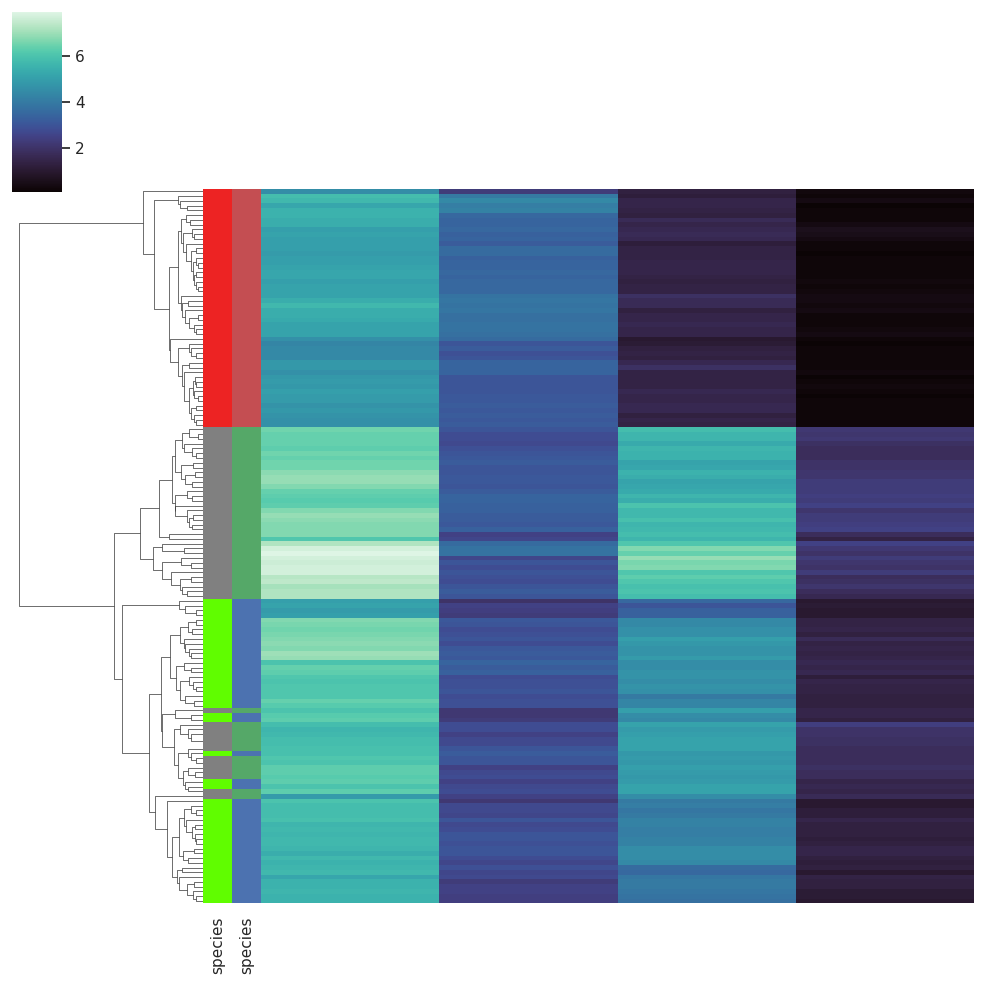

In [ ]:
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt
import pandas as pd

iris = sns.load_dataset("iris")
print(iris)
species = iris.pop("species")


lut1 = dict(zip(species.unique(), ['#ED2323','#60FD00','#808080']))
row_colors1 = species.map(lut1)

lut2 = dict(zip(species.unique(), "rbg"))
row_colors2 = species.map(lut2)

row_colors = pd.concat([row_colors1,row_colors2],axis=1)
print(row_colors)

g = sns.clustermap(iris, row_colors=row_colors, col_cluster=False,cmap="mako", yticklabels=False, xticklabels=False)

plt.show()

In [ ]:
import pandas as pd
from dash import dcc
import dash_bio as dashbio

df = pd.read_csv('https://git.io/clustergram_brain_cancer.csv').set_index('ID_REF')

columns = list(df.columns.values)
rows = list(df.index)

clustergram = dashbio.Clustergram(
    data=df.loc[rows].values,
    row_labels=rows,
    column_labels=columns,
    color_threshold={
        'row': 250,
        'col': 700
    },
    height=800,
    width=700,
    hidden_labels='row',
)

dcc.Graph(figure=clustergram)
with open('plot.html', 'w') as f:
    f.write(clustergram.to_html(full_html=False, include_plotlyjs='cdn'))